In [52]:
# Load libraries
import pandas as pd
from pandas import read_csv
import numpy as np
import seaborn as sns
import plotly.graph_objects as go
from pandas.plotting import scatter_matrix
import matplotlib.pyplot as plt 
from sklearn.preprocessing import StandardScaler
from sklearn.inspection import permutation_importance
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import StratifiedKFold
from sklearn.model_selection import KFold
from sklearn.model_selection import validation_curve
from sklearn.model_selection import learning_curve
#Classification
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC
from sklearn.neural_network import MLPClassifier
#Regression
from sklearn.tree import DecisionTreeRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.ensemble import AdaBoostRegressor
from sklearn.neural_network import MLPRegressor
#Metrics Class.
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score
#Metrics Regr.
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error
#Data Sets
from sklearn.datasets import fetch_california_housing

In [53]:
california_housing = fetch_california_housing(as_frame=True)
print(california_housing.DESCR)

.. _california_housing_dataset:

California Housing dataset
--------------------------

**Data Set Characteristics:**

    :Number of Instances: 20640

    :Number of Attributes: 8 numeric, predictive attributes and the target

    :Attribute Information:
        - MedInc        median income in block group
        - HouseAge      median house age in block group
        - AveRooms      average number of rooms per household
        - AveBedrms     average number of bedrooms per household
        - Population    block group population
        - AveOccup      average number of household members
        - Latitude      block group latitude
        - Longitude     block group longitude

    :Missing Attribute Values: None

This dataset was obtained from the StatLib repository.
https://www.dcc.fc.up.pt/~ltorgo/Regression/cal_housing.html

The target variable is the median house value for California districts,
expressed in hundreds of thousands of dollars ($100,000).

This dataset was derived

In [54]:
california_housing.frame.head(10)

,MedInc,HouseAge,AveRooms,AveBedrms,Population,AveOccup,Latitude,Longitude,MedHouseVal
0,8.3252,41.0,6.984127,1.023810,322.0,2.555556,37.88,-122.23,4.526
1,8.3014,21.0,6.238137,0.971880,2401.0,2.109842,37.86,-122.22,3.585
2,7.2574,52.0,8.288136,1.073446,496.0,2.802260,37.85,-122.24,3.521
3,5.6431,52.0,5.817352,1.073059,558.0,2.547945,37.85,-122.25,3.413
4,3.8462,52.0,6.281853,1.081081,565.0,2.181467,37.85,-122.25,3.422
5,4.0368,52.0,4.761658,1.103627,413.0,2.139896,37.85,-122.25,2.697
6,3.6591,52.0,4.931907,0.951362,1094.0,2.128405,37.84,-122.25,2.992
7,3.1200,52.0,4.797527,1.061824,1157.0,1.788253,37.84,-122.25,2.414
8,2.0804,42.0,4.294118,1.117647,1206.0,2.026891,37.84,-122.26,2.267
9,3.6912,52.0,4.970588,0.990196,1551.0,2.172269,37.84,-122.25,2.611


In [55]:
california_housing.frame.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20640 entries, 0 to 20639
Data columns (total 9 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   MedInc       20640 non-null  float64
 1   HouseAge     20640 non-null  float64
 2   AveRooms     20640 non-null  float64
 3   AveBedrms    20640 non-null  float64
 4   Population   20640 non-null  float64
 5   AveOccup     20640 non-null  float64
 6   Latitude     20640 non-null  float64
 7   Longitude    20640 non-null  float64
 8   MedHouseVal  20640 non-null  float64
dtypes: float64(9)
memory usage: 1.4 MB


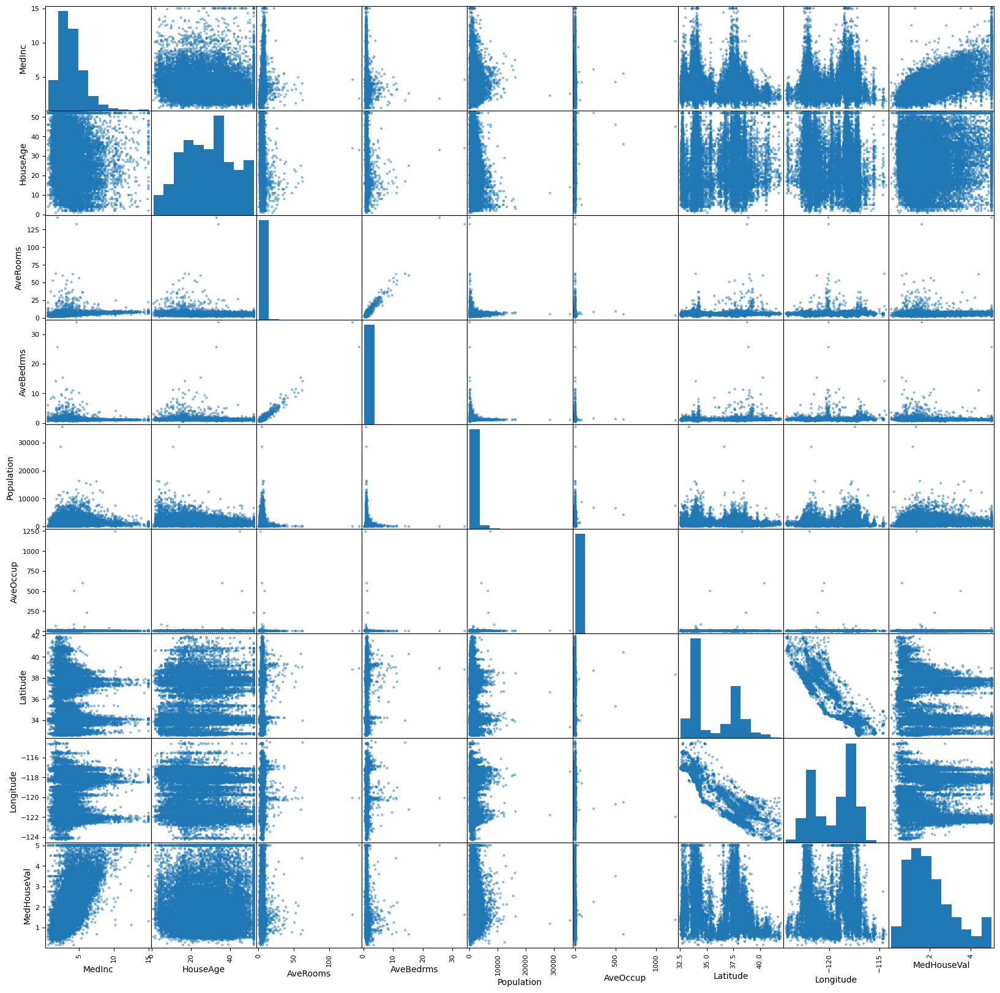

In [56]:
scatter_matrix(california_housing.frame)
plt.rcParams["figure.figsize"] = (20,20)
plt.show()

In [57]:
features_of_interest = ["AveRooms", "AveBedrms", "AveOccup", "Population"]
california_housing.frame[features_of_interest].describe()

,AveRooms,AveBedrms,AveOccup,Population
count,20640.000000,20640.000000,20640.000000,20640.000000
mean,5.429000,1.096675,3.070655,1425.476744
std,2.474173,0.473911,10.386050,1132.462122
min,0.846154,0.333333,0.692308,3.000000
25%,4.440716,1.006079,2.429741,787.000000
50%,5.229129,1.048780,2.818116,1166.000000
75%,6.052381,1.099526,3.282261,1725.000000
max,141.909091,34.066667,1243.333333,35682.000000


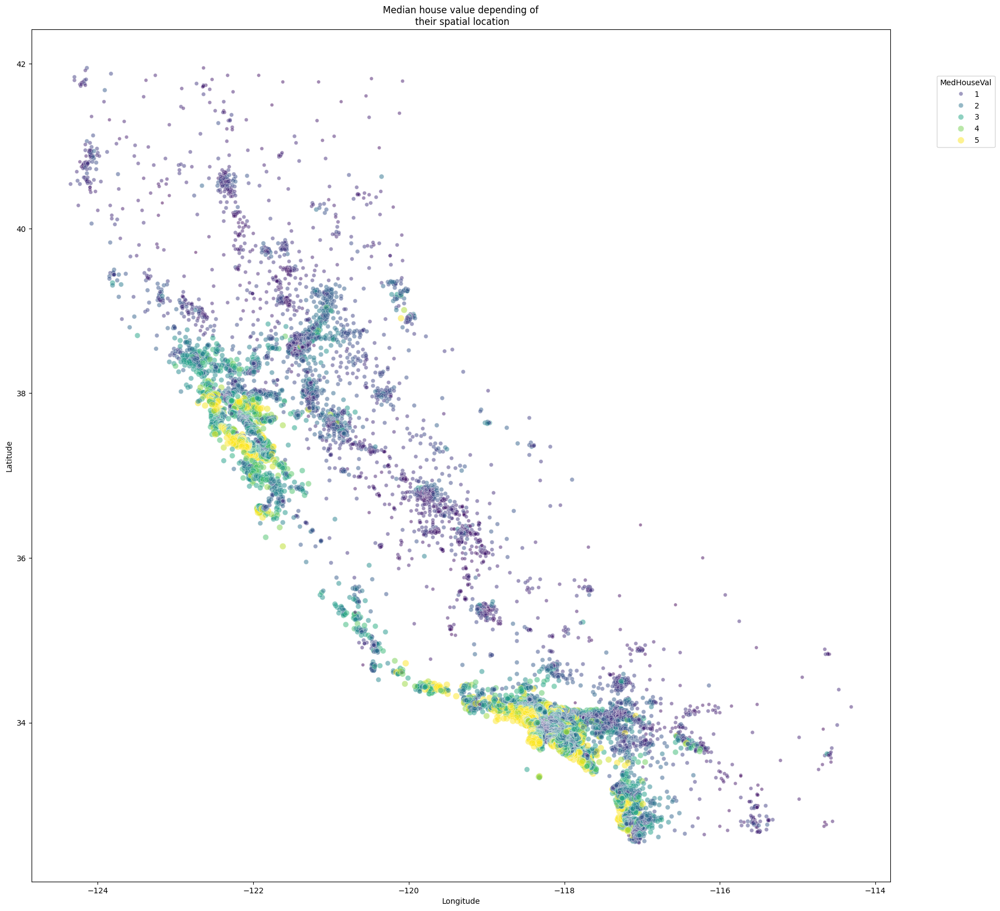

In [58]:
sns.scatterplot(data=california_housing.frame, x="Longitude", y="Latitude",
                size="MedHouseVal", hue="MedHouseVal",
                palette="viridis", alpha=0.5)
plt.legend(title="MedHouseVal", bbox_to_anchor=(1.05, 0.95),
           loc="upper left")
_ = plt.title("Median house value depending of\n their spatial location")

In [59]:
rng = np.random.RandomState(0)
indices = rng.choice(np.arange(california_housing.frame.shape[0]), size=500,
                     replace=False)

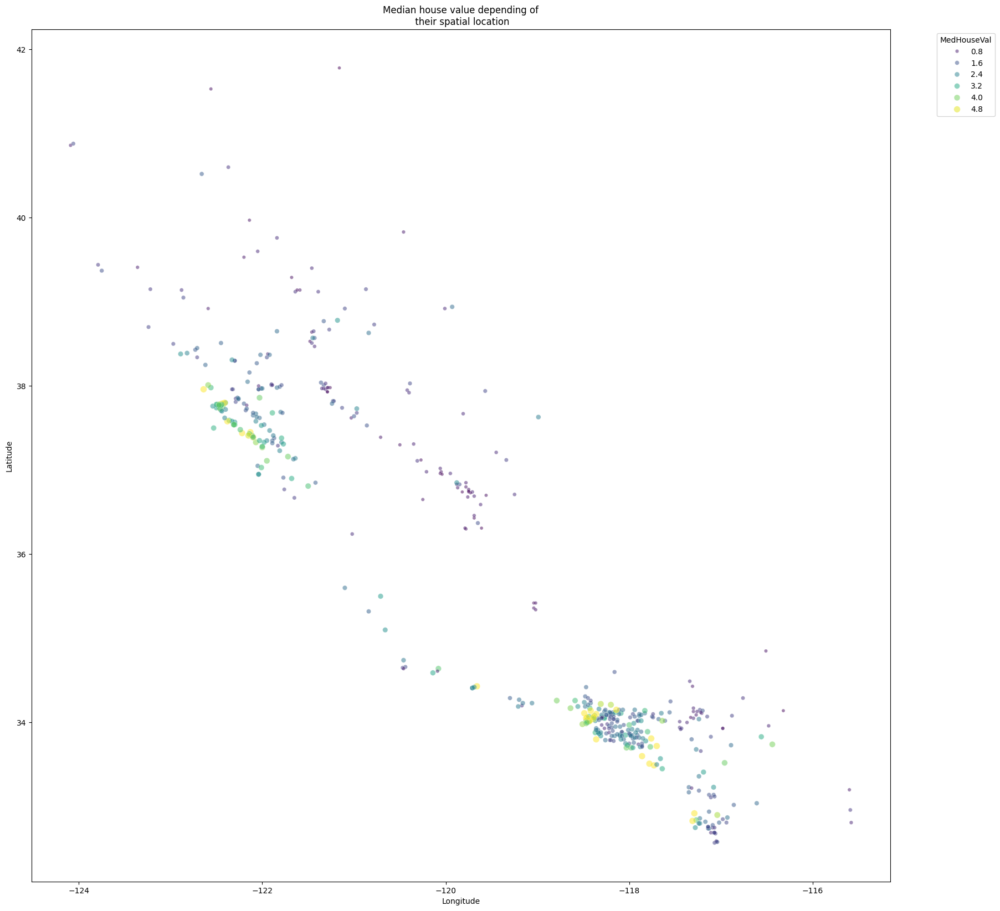

In [60]:
sns.scatterplot(data=california_housing.frame.iloc[indices],
                x="Longitude", y="Latitude",
                size="MedHouseVal", hue="MedHouseVal",
                palette="viridis", alpha=0.5)
plt.legend(title="MedHouseVal", bbox_to_anchor=(1.05, 1),
           loc="upper left")
_ = plt.title("Median house value depending of\n their spatial location")

In [61]:
# Drop the unwanted columns
columns_drop = ["Longitude", "Latitude"]
subset = california_housing.frame.iloc[indices].drop(columns=columns_drop)
# Quantize the target and keep the midpoint for each interval
subset["MedHouseVal"] = pd.qcut(subset["MedHouseVal"], 6, retbins=False)
subset["MedHouseVal"] = subset["MedHouseVal"].apply(lambda x: x.mid)

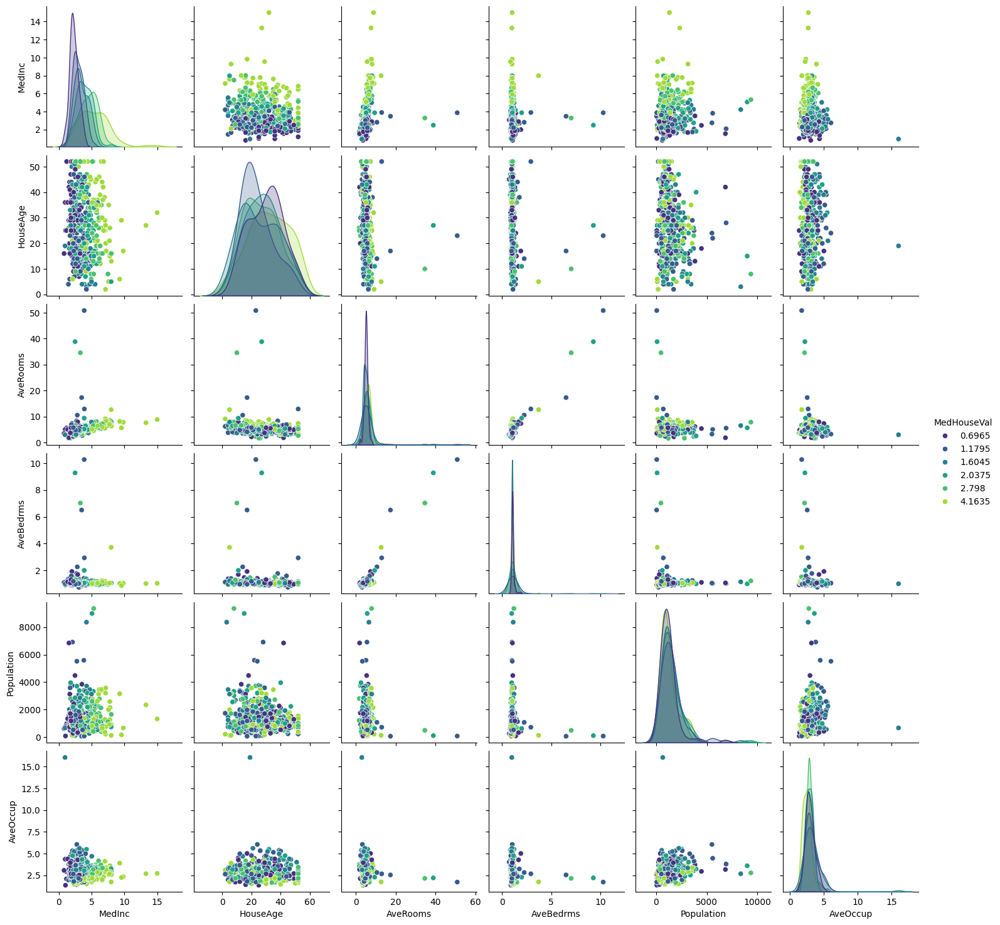

In [62]:
_ = sns.pairplot(data=subset, hue="MedHouseVal", palette="viridis")

In [63]:
#Array and Data Split
X = california_housing.data.values
y = california_housing.target.values
#Data Split (80/20)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2)

# KNN regression

In [36]:
# KNN Regression
algo = KNeighborsRegressor()
#create 10 folds
kfold = KFold(n_splits=5, random_state=7, shuffle=True)
# Define our candidate hyperparameters
#n_neighbors = np.arange(2,10,1)
hp_candidates = [{'n_neighbors': [2,3,4,5,6,7,8,9], 'weights': ['uniform','distance']}]
# Search for best hyperparameters
grid = GridSearchCV(estimator=algo, param_grid=hp_candidates, cv=kfold, scoring='r2')
grid.fit(X_train, y_train)
# Get the results
#print(grid.best_score_)
#print(grid.best_estimator_)
#print(grid.best_params_)
print("The best parameters are %s with a score of %0.2f"
      % (grid.best_params_, grid.best_score_))
#scoring = 'neg_mean_squared_error'
#results = cross_val_score(model, X, Y, cv=kfold, scoring=scoring)
#print(results.mean())

The best parameters are {'n_neighbors': 9, 'weights': 'distance'} with a score of 0.17


In [37]:
#grid.cv_results_

In [38]:
grid_results = pd.concat([pd.DataFrame(grid.cv_results_["params"]),pd.DataFrame(grid.cv_results_["mean_test_score"], columns=["res"])],axis=1)
grid_results.head()

,n_neighbors,weights,res
0,2,uniform,0.023274
1,2,distance,0.033283
2,3,uniform,0.087947
3,3,distance,0.105239
4,4,uniform,0.116165


In [39]:
grid_contour = grid_results.groupby(['n_neighbors','weights']).mean()
grid_contour

res
n_neighbors weights           
2           distance  0.033283
            uniform   0.023274
3           distance  0.105239
            uniform   0.087947
4           distance  0.136106
            uniform   0.116165
5           distance  0.152200
            uniform   0.129933
6           distance  0.157814
            uniform   0.133925
7           distance  0.159739
            uniform   0.133880
8           distance  0.163833
            uniform   0.137730
9           distance  0.165026
            uniform   0.137774

In [41]:
grid_reset = grid_contour.reset_index()
grid_reset.columns = ['n_neighbors', 'weights', 'res']
grid_pivot = grid_reset.pivot(index='n_neighbors', columns='weights')
grid_pivot

res          
weights      distance   uniform
n_neighbors                    
2            0.033283  0.023274
3            0.105239  0.087947
4            0.136106  0.116165
5            0.152200  0.129933
6            0.157814  0.133925
7            0.159739  0.133880
8            0.163833  0.137730
9            0.165026  0.137774

In [42]:
x = grid_pivot.columns.levels[1].values
y = grid_pivot.index.values
z = grid_pivot.values

# X and Y axes labels
layout = go.Layout(
            xaxis=go.layout.XAxis(
              title=go.layout.xaxis.Title(
              text='weights')
             ),
             yaxis=go.layout.YAxis(
              title=go.layout.yaxis.Title(
              text='n_neighbors') 
            ) )

fig = go.Figure(data = [go.Contour(z=z, x=x, y=y)], layout=layout )

fig.update_layout(title='Hyperparameter tuning', autosize=False,
                  width=1000, height=1000,
                  margin=dict(l=65, r=50, b=65, t=90))

fig.show()

In [43]:
n_neighbors_best = grid.cv_results_['param_n_neighbors'][grid.best_index_]
weights_best = grid.cv_results_['param_weights'][grid.best_index_]
model = KNeighborsRegressor(n_neighbors=n_neighbors_best, weights=weights_best)
model.fit(X_train,y_train)
res = model.predict(X_test)
#print(res)

In [44]:
#Mean Squared Error (MSE)
print(mean_squared_error(res,y_test))

1.0420005966117503


In [45]:
#Root Mean Squared Error (RMSE)
print(mean_squared_error(res,y_test,squared=False))

1.020784304646065


In [46]:
#Mean Absolute Error (MAE)
print(mean_absolute_error(res,y_test))

0.7904049660269723


In [47]:
#dataframe with results
df_test = pd.DataFrame(y_test, columns =['test'])
df_pred = pd.DataFrame(res, columns =['pred'])
df = pd.concat([df_test,df_pred],axis=1)
df['diff'] = df['test'] - df['pred']

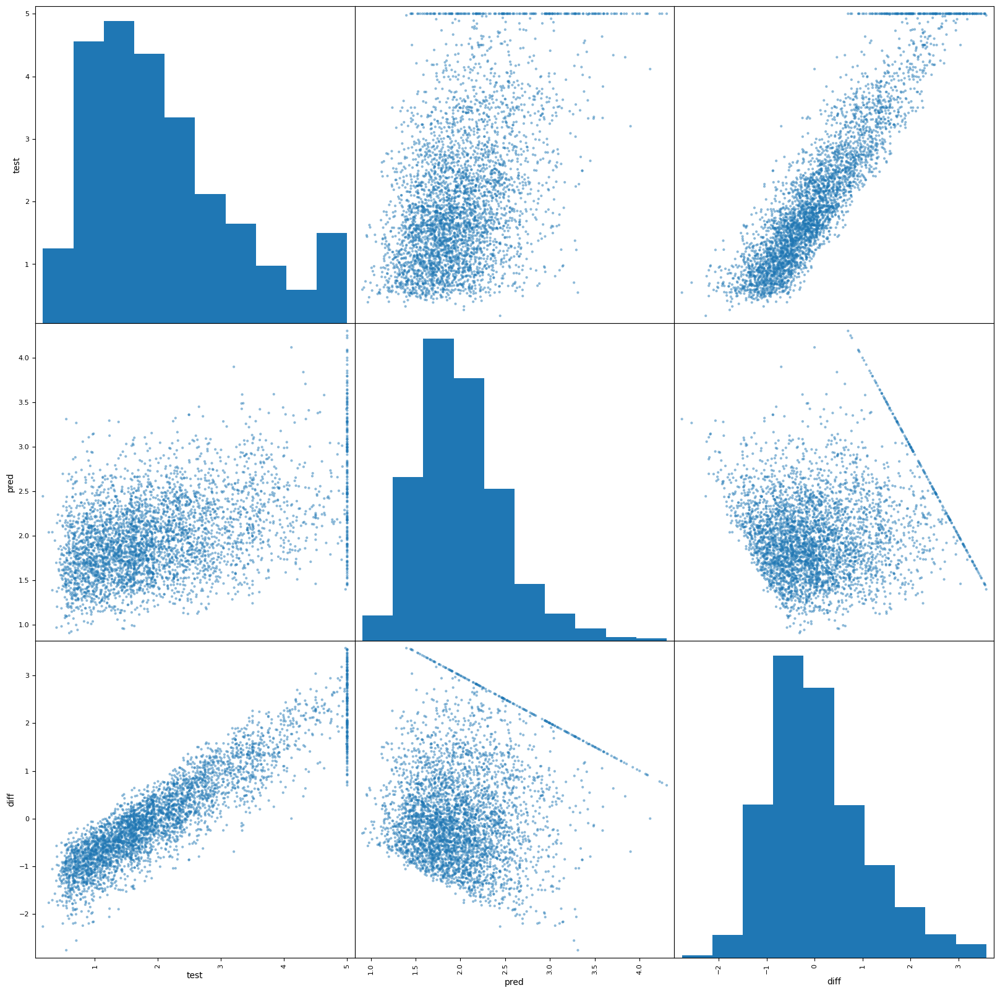

In [48]:
scatter_matrix(df)
plt.rcParams["figure.figsize"] = (20,20)
plt.show()

In [49]:
df

,test,pred,diff
0,1.90100,2.031980,-0.130980
1,1.13300,1.831415,-0.698415
2,2.50600,2.122828,0.383172
3,1.82100,1.486029,0.334971
4,1.14100,1.796167,-0.655167
...,...,...,...
4123,5.00001,3.604301,1.395709
4124,1.23100,1.807781,-0.576781
4125,2.55400,1.370621,1.183379
4126,2.60900,1.898291,0.710709


# Random Forrest

In [13]:
# Random Forrest
algo = RandomForestRegressor()
#create folds
kfold = KFold(n_splits=3, random_state=7, shuffle=True)
# Define our candidate hyperparameters
max_features_range = np.arange(1,5,1)
n_estimators_range = np.arange(100,200,10)
param_grid = dict(max_features=max_features_range, n_estimators=n_estimators_range)
# Search for best hyperparameters
grid = GridSearchCV(estimator=algo, param_grid=param_grid, cv=kfold, scoring='r2', verbose=4, n_jobs=2)
grid.fit(X_train, y_train)
# Get the results
#print(grid.best_score_)
#print(grid.best_estimator_)
#print(grid.best_params_)
print("The best parameters are %s with a score of %0.2f"
      % (grid.best_params_, grid.best_score_))

Fitting 3 folds for each of 40 candidates, totalling 120 fits
[CV 1/3] END ..max_features=1, n_estimators=100;, score=0.789 total time=   2.6s
[CV 2/3] END ..max_features=1, n_estimators=100;, score=0.788 total time=   2.5s
[CV 3/3] END ..max_features=1, n_estimators=100;, score=0.779 total time=   2.5s
[CV 1/3] END ..max_features=1, n_estimators=110;, score=0.785 total time=   2.8s
[CV 2/3] END ..max_features=1, n_estimators=110;, score=0.786 total time=   3.1s
[CV 3/3] END ..max_features=1, n_estimators=110;, score=0.777 total time=   3.0s
[CV 1/3] END ..max_features=1, n_estimators=120;, score=0.783 total time=   3.0s
[CV 2/3] END ..max_features=1, n_estimators=120;, score=0.786 total time=   3.1s
[CV 3/3] END ..max_features=1, n_estimators=120;, score=0.780 total time=   3.3s
[CV 1/3] END ..max_features=1, n_estimators=130;, score=0.788 total time=   3.4s
[CV 2/3] END ..max_features=1, n_estimators=130;, score=0.791 total time=   3.1s
[CV 3/3] END ..max_features=1, n_estimators=130

In [14]:
#grid.cv_results_

In [15]:
grid_results = pd.concat([pd.DataFrame(grid.cv_results_["params"]),pd.DataFrame(grid.cv_results_["mean_test_score"], columns=["r2"])],axis=1)
grid_contour = grid_results.groupby(['max_features','n_estimators']).mean()
grid_reset = grid_contour.reset_index()
grid_reset.columns = ['max_features', 'n_estimators', 'r2']
grid_pivot = grid_reset.pivot(index='max_features', columns='n_estimators')
x = grid_pivot.columns.levels[1].values
y = grid_pivot.index.values
z = grid_pivot.values
# X and Y axes labels
layout = go.Layout(
            xaxis=go.layout.XAxis(
              title=go.layout.xaxis.Title(
              text='n_estimators')
             ),
             yaxis=go.layout.YAxis(
              title=go.layout.yaxis.Title(
              text='max_features') 
            ) )

fig = go.Figure(data = [go.Contour(z=z, x=x, y=y)], layout=layout )

fig.update_layout(title='Hyperparameter tuning', autosize=False,
                  width=500, height=500,
                  margin=dict(l=65, r=50, b=65, t=90))

fig.show()

In [16]:
n_estimators_best = grid.cv_results_['param_n_estimators'][grid.best_index_]
max_features_best = grid.cv_results_['param_max_features'][grid.best_index_]
model = RandomForestRegressor(max_features=max_features_best, n_estimators=n_estimators_best)
model.fit(X_train,y_train)
res = model.predict(X_test)

In [17]:
#Mean Squared Error (MSE)
print(mean_squared_error(res,y_test))

0.2675003858160759


In [18]:
#Root Mean Squared Error (RMSE)
print(mean_squared_error(res,y_test,squared=False))

0.5172043946217741


In [19]:
#Mean Absolute Error (MAE)
print(mean_absolute_error(res,y_test))

0.3306388060590519


In [20]:
#dataframe with results
df_test = pd.DataFrame(y_test, columns =['test'])
df_pred = pd.DataFrame(res, columns =['pred'])
df = pd.concat([df_test,df_pred],axis=1)
df['diff'] = df['test'] - df['pred']

In [21]:
#plt.figure(); 
#df.plot(x='test',y='pred',style='o'); 
#plt.legend(loc='best');

In [22]:
#plt.figure(); 
#df['diff'].plot.hist(bins=50); 

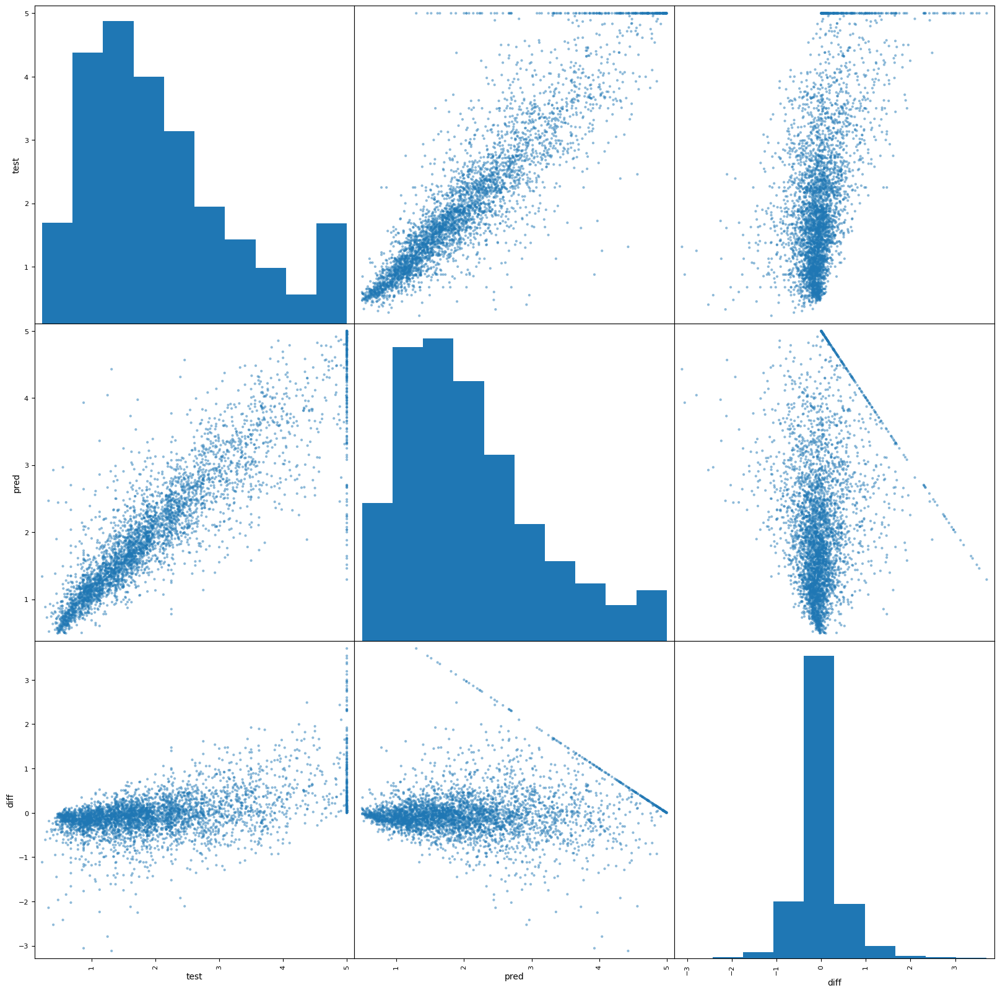

In [23]:
scatter_matrix(df)
plt.rcParams["figure.figsize"] = (20,20)
plt.show()

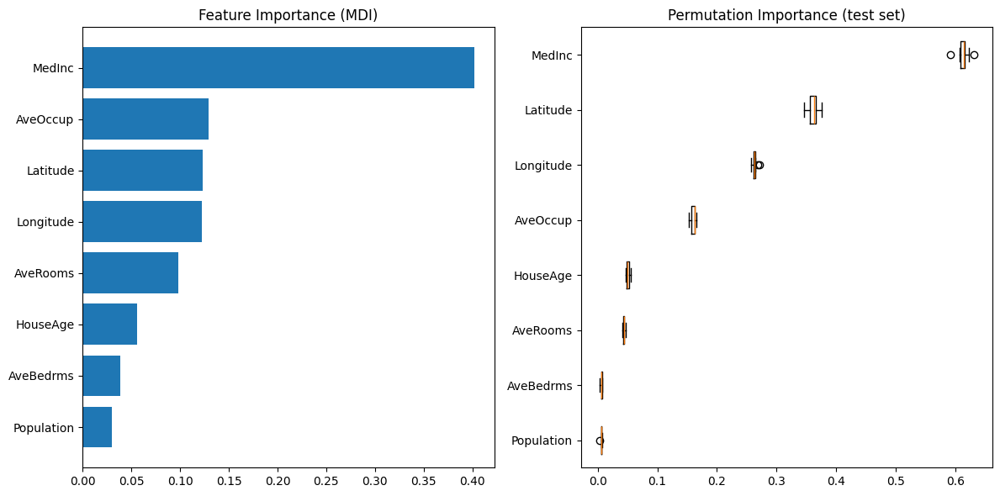

In [24]:
feature_importance = model.feature_importances_
sorted_idx = np.argsort(feature_importance)
pos = np.arange(sorted_idx.shape[0]) + 0.5
fig = plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.barh(pos, feature_importance[sorted_idx], align="center")
column_headers = list(california_housing.data.columns.values)
plt.yticks(pos, np.array(column_headers)[sorted_idx])
plt.title("Feature Importance (MDI)")

result = permutation_importance(
    model, X_test, y_test, n_repeats=10, random_state=42, n_jobs=2
)
sorted_idx = result.importances_mean.argsort()
plt.subplot(1, 2, 2)
plt.boxplot(
    result.importances[sorted_idx].T,
    vert=False,
    labels=np.array(column_headers)[sorted_idx],
)
plt.title("Permutation Importance (test set)")
fig.tight_layout()
plt.show()

# Gradient Boosting

In [40]:
# Gradient Boosting
algo = GradientBoostingRegressor()
#create 5 folds
kfold = KFold(n_splits=5, random_state=7, shuffle=True)
# Define our candidate hyperparameters
max_features_range = np.arange(4,7,1)
n_estimators_range = np.arange(150,250,10)
param_grid = dict(max_features=max_features_range, n_estimators=n_estimators_range)
# Search for best hyperparameters
grid = GridSearchCV(estimator=algo, param_grid=param_grid, cv=kfold, scoring='r2', verbose=4, n_jobs=2)
grid.fit(X_train, y_train)
# Get the results
#print(grid.best_score_)
#print(grid.best_estimator_)
#print(grid.best_params_)
print("The best parameters are %s with a score of %0.2f"
      % (grid.best_params_, grid.best_score_))

Fitting 5 folds for each of 30 candidates, totalling 150 fits


[CV 1/5] END ..max_features=4, n_estimators=150;, score=0.812 total time=   4.1s
[CV 2/5] END ..max_features=4, n_estimators=150;, score=0.806 total time=   4.5s
[CV 3/5] END ..max_features=4, n_estimators=150;, score=0.802 total time=   4.2s
[CV 4/5] END ..max_features=4, n_estimators=150;, score=0.782 total time=   3.9s
[CV 5/5] END ..max_features=4, n_estimators=150;, score=0.791 total time=   3.6s
[CV 1/5] END ..max_features=4, n_estimators=160;, score=0.815 total time=   3.9s
[CV 2/5] END ..max_features=4, n_estimators=160;, score=0.808 total time=   4.3s
[CV 3/5] END ..max_features=4, n_estimators=160;, score=0.801 total time=   4.0s
[CV 4/5] END ..max_features=4, n_estimators=160;, score=0.783 total time=   4.5s
[CV 5/5] END ..max_features=4, n_estimators=160;, score=0.787 total time=   4.8s
[CV 1/5] END ..max_features=4, n_estimators=170;, score=0.815 total time=   3.9s
[CV 2/5] END ..max_features=4, n_estimators=170;, score=0.811 total time=   4.3s
[CV 3/5] END ..max_features=

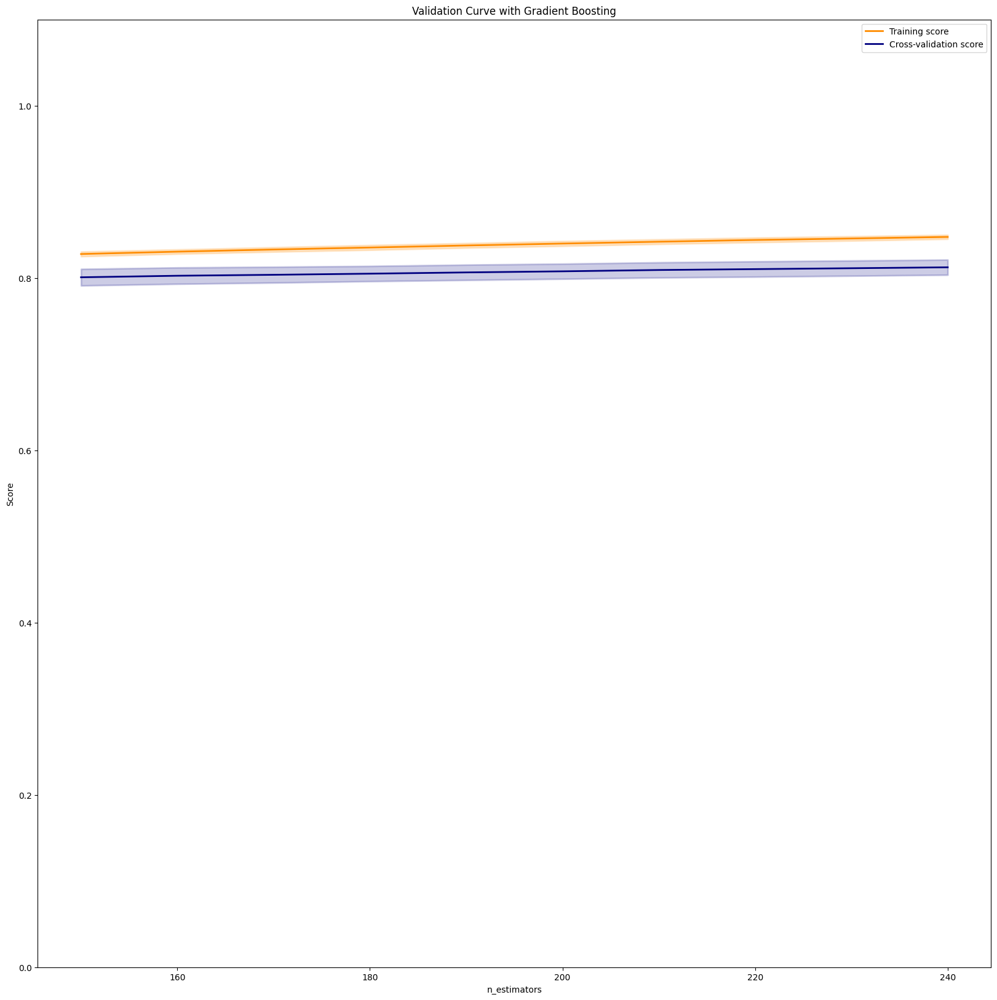

In [41]:
#validation curve for single parameter
param_range = np.arange(150,250,10)
train_scores, valid_scores = validation_curve(
    algo,
    X_train,
    y_train,
    param_name="n_estimators",
    param_range=param_range,
    scoring="r2",
    n_jobs=2,
)
train_scores_mean = np.mean(train_scores, axis=1)
train_scores_std = np.std(train_scores, axis=1)
valid_scores_mean = np.mean(valid_scores, axis=1)
valid_scores_std = np.std(valid_scores, axis=1)

plt.title("Validation Curve with Gradient Boosting")
plt.xlabel("n_estimators")
plt.ylabel("Score")
plt.ylim(0.0, 1.1)
lw = 2
plt.plot(
    param_range, train_scores_mean, label="Training score", color="darkorange", lw=lw
)
plt.fill_between(
    param_range,
    train_scores_mean - train_scores_std,
    train_scores_mean + train_scores_std,
    alpha=0.2,
    color="darkorange",
    lw=lw,
)
plt.plot(
    param_range, valid_scores_mean, label="Cross-validation score", color="navy", lw=lw
)
plt.fill_between(
    param_range,
    valid_scores_mean - valid_scores_std,
    valid_scores_mean + valid_scores_std,
    alpha=0.2,
    color="navy",
    lw=lw,
)
plt.legend(loc="best")
plt.show()

In [42]:
#grid.cv_results_

In [43]:
grid_results = pd.concat([pd.DataFrame(grid.cv_results_["params"]),pd.DataFrame(grid.cv_results_["mean_test_score"], columns=["r2"])],axis=1)
grid_contour = grid_results.groupby(['max_features','n_estimators']).mean()
grid_reset = grid_contour.reset_index()
grid_reset.columns = ['max_features', 'n_estimators', 'r2']
grid_pivot = grid_reset.pivot(index='max_features', columns='n_estimators')
x = grid_pivot.columns.levels[1].values
y = grid_pivot.index.values
z = grid_pivot.values
# X and Y axes labels
layout = go.Layout(
            xaxis=go.layout.XAxis(
              title=go.layout.xaxis.Title(
              text='n_estimators')
             ),
             yaxis=go.layout.YAxis(
              title=go.layout.yaxis.Title(
              text='max_features') 
            ) )

fig = go.Figure(data = [go.Contour(z=z, x=x, y=y)], layout=layout )

fig.update_layout(title='Hyperparameter tuning', autosize=False,
                  width=500, height=500,
                  margin=dict(l=65, r=50, b=65, t=90))

fig.show()

In [44]:
n_estimators_best = grid.cv_results_['param_n_estimators'][grid.best_index_]
max_features_best = grid.cv_results_['param_max_features'][grid.best_index_]
model = GradientBoostingRegressor(max_features=max_features_best, n_estimators=n_estimators_best)
model.fit(X_train,y_train)
res = model.predict(X_test)

In [45]:
#Mean Squared Error (MSE)
print(mean_squared_error(res,y_test))

0.2440325305009121


In [46]:
#Root Mean Squared Error (RMSE)
print(mean_squared_error(res,y_test,squared=False))

0.4939964883487656


In [47]:
#Mean Absolute Error (MAE)
print(mean_absolute_error(res,y_test))

0.3413606228443068


In [48]:
#dataframe with results
df_test = pd.DataFrame(y_test, columns =['test'])
df_pred = pd.DataFrame(res, columns =['pred'])
df = pd.concat([df_test,df_pred],axis=1)
df['diff'] = df['test'] - df['pred']

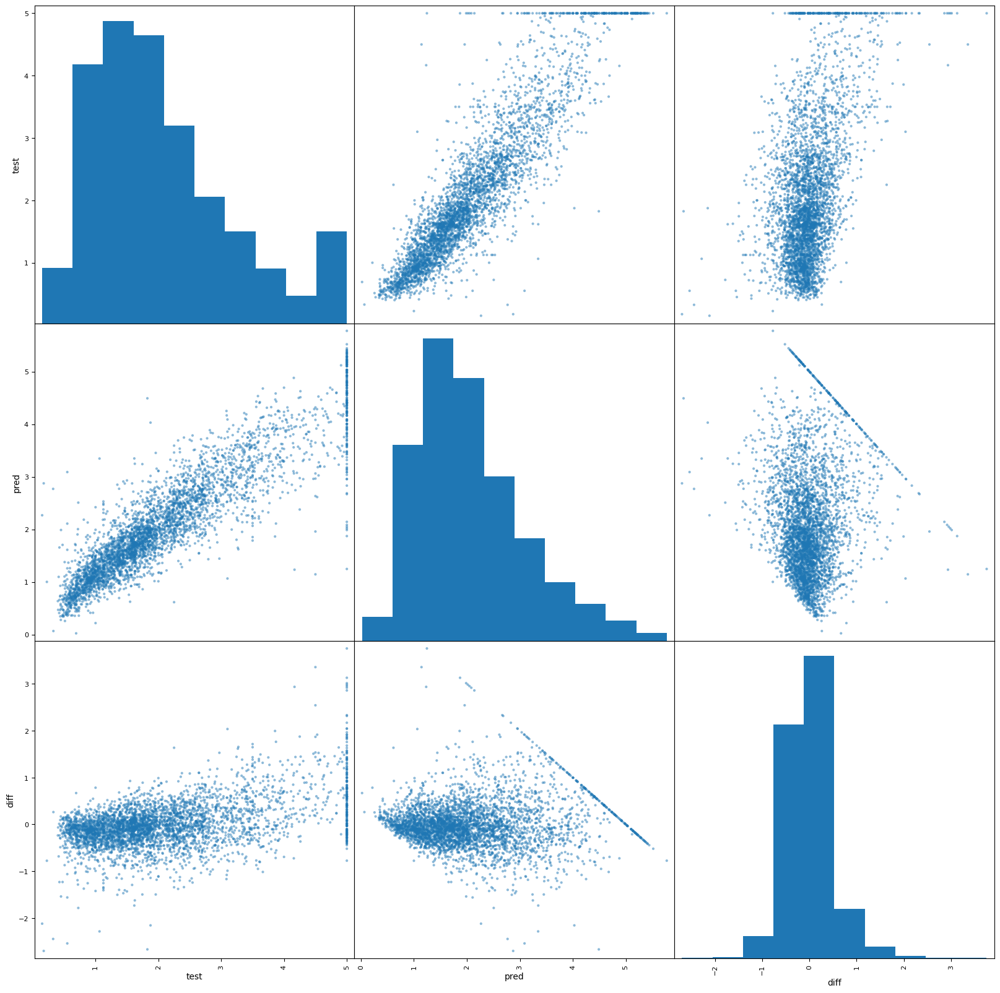

In [49]:
scatter_matrix(df)
plt.rcParams["figure.figsize"] = (20,20)
plt.show()

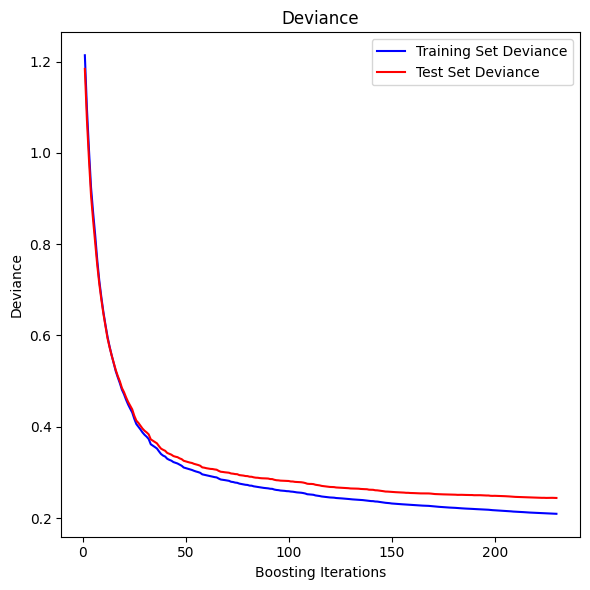

In [50]:
test_score = np.zeros((n_estimators_best,), dtype=np.float64)
for i, y_pred in enumerate(model.staged_predict(X_test)):
    test_score[i] = mean_squared_error(y_test, y_pred)

fig = plt.figure(figsize=(6, 6))
plt.subplot(1, 1, 1)
plt.title("Deviance")
plt.plot(
    np.arange(n_estimators_best) + 1,
    model.train_score_,
    "b-",
    label="Training Set Deviance",
)
plt.plot(
    np.arange(n_estimators_best) + 1, test_score, "r-", label="Test Set Deviance"
)
plt.legend(loc="upper right")
plt.xlabel("Boosting Iterations")
plt.ylabel("Deviance")
fig.tight_layout()
plt.show()

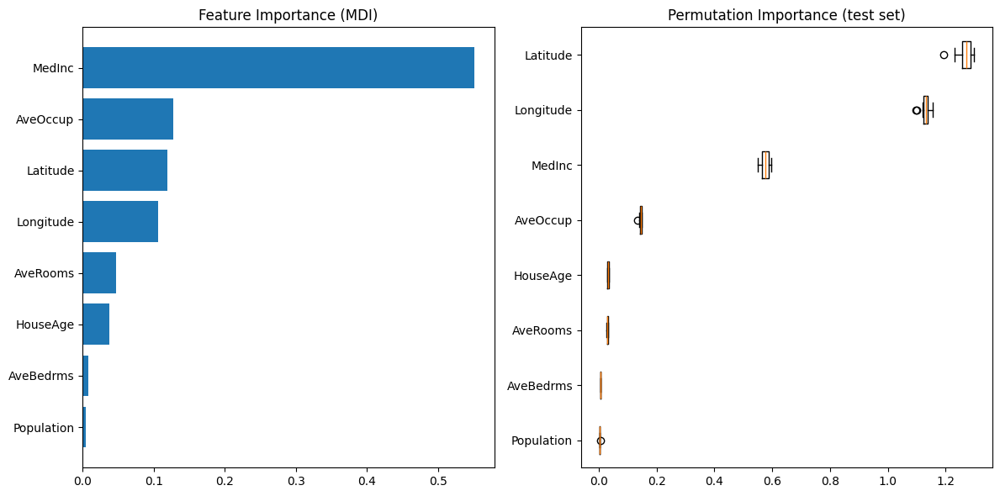

In [51]:
feature_importance = model.feature_importances_
sorted_idx = np.argsort(feature_importance)
pos = np.arange(sorted_idx.shape[0]) + 0.5
fig = plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.barh(pos, feature_importance[sorted_idx], align="center")
column_headers = list(california_housing.data.columns.values)
plt.yticks(pos, np.array(column_headers)[sorted_idx])
plt.title("Feature Importance (MDI)")

result = permutation_importance(
    model, X_test, y_test, n_repeats=10, random_state=42, n_jobs=2
)
sorted_idx = result.importances_mean.argsort()
plt.subplot(1, 2, 2)
plt.boxplot(
    result.importances[sorted_idx].T,
    vert=False,
    labels=np.array(column_headers)[sorted_idx],
)
plt.title("Permutation Importance (test set)")
fig.tight_layout()
plt.show()

# Adaboost

In [66]:
# Adaboost
algo = AdaBoostRegressor(estimator=DecisionTreeRegressor())

# create 5 folds
kfold = KFold(n_splits=5, random_state=7, shuffle=True)

# Define our candidate hyperparameters
param_grid = {'estimator__max_depth':[i for i in range(2,11,2)],
              #'estimator__min_samples_leaf':[5,10],
              'n_estimators':np.arange(10,210,10)}

# Search for best hyperparameters
grid = GridSearchCV(estimator=algo, param_grid=param_grid, cv=kfold, scoring='r2', verbose=2, n_jobs=2)
grid.fit(X_train, y_train)

# Get the results
#print(grid.best_score_)
#print(grid.best_estimator_)
#print(grid.best_params_)

print("The best parameters are %s with a score of %0.2f"
      % (grid.best_params_, grid.best_score_))

Fitting 5 folds for each of 100 candidates, totalling 500 fits
[CV] END ............estimator__max_depth=2, n_estimators=10; total time=   0.4s
[CV] END ............estimator__max_depth=2, n_estimators=10; total time=   0.3s
[CV] END ............estimator__max_depth=2, n_estimators=10; total time=   0.3s
[CV] END ............estimator__max_depth=2, n_estimators=10; total time=   0.3s
[CV] END ............estimator__max_depth=2, n_estimators=10; total time=   0.3s
[CV] END ............estimator__max_depth=2, n_estimators=20; total time=   0.6s
[CV] END ............estimator__max_depth=2, n_estimators=20; total time=   0.5s
[CV] END ............estimator__max_depth=2, n_estimators=20; total time=   0.7s
[CV] END ............estimator__max_depth=2, n_estimators=20; total time=   0.7s
[CV] END ............estimator__max_depth=2, n_estimators=20; total time=   0.5s
[CV] END ............estimator__max_depth=2, n_estimators=30; total time=   0.6s
[CV] END ............estimator__max_depth=2, n

In [67]:
#grid.cv_results_

In [68]:
grid_results = pd.concat([pd.DataFrame(grid.cv_results_["params"]),pd.DataFrame(grid.cv_results_["mean_test_score"], columns=["r2"])],axis=1)
grid_contour = grid_results.groupby(['estimator__max_depth','n_estimators']).mean()
grid_reset = grid_contour.reset_index()
grid_reset.columns = ['estimator__max_depth', 'n_estimators', 'r2']
grid_pivot = grid_reset.pivot(index='estimator__max_depth', columns='n_estimators')
x = grid_pivot.columns.levels[1].values
y = grid_pivot.index.values
z = grid_pivot.values
# X and Y axes labels
layout = go.Layout(
            xaxis=go.layout.XAxis(
              title=go.layout.xaxis.Title(
              text='n_estimators')
             ),
             yaxis=go.layout.YAxis(
              title=go.layout.yaxis.Title(
              text='estimator__max_depth') 
            ) )

fig = go.Figure(data = [go.Contour(z=z, x=x, y=y)], layout=layout )

fig.update_layout(title='Hyperparameter tuning', autosize=False,
                  width=500, height=500,
                  margin=dict(l=65, r=50, b=65, t=90))

fig.show()

In [71]:
n_estimators_best = grid.cv_results_['param_n_estimators'][grid.best_index_]
estimator_max_depth_best = grid.cv_results_['param_estimator__max_depth'][grid.best_index_]
model = AdaBoostRegressor(estimator=DecisionTreeRegressor(max_depth=estimator_max_depth_best), n_estimators=n_estimators_best)
model.fit(X_train,y_train)
res = model.predict(X_test)

In [72]:
#Mean Squared Error (MSE)
print(mean_squared_error(res,y_test))

0.2577943151153863


In [73]:
#Root Mean Squared Error (RMSE)
print(mean_squared_error(res,y_test,squared=False))

0.5077344927374802


In [74]:
#Mean Absolute Error (MAE)
print(mean_absolute_error(res,y_test))

0.3746702075381351


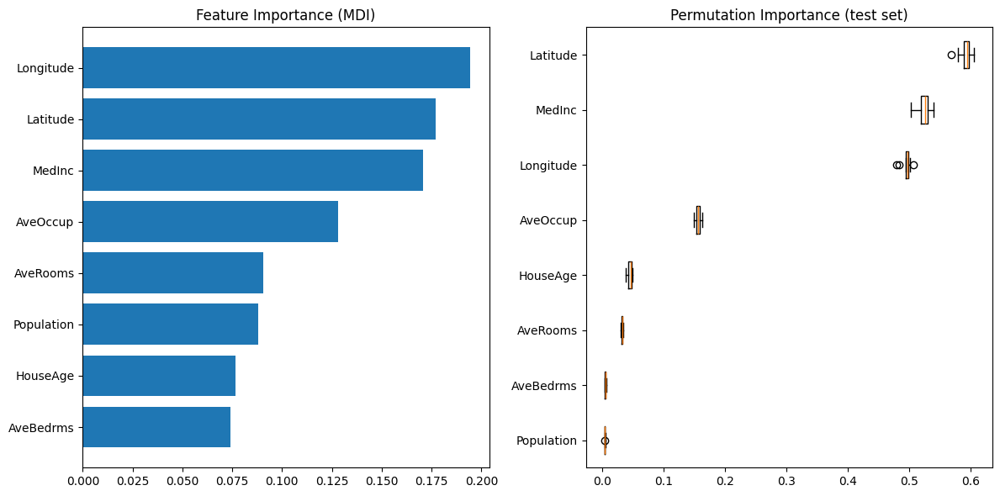

In [75]:
feature_importance = model.feature_importances_
sorted_idx = np.argsort(feature_importance)
pos = np.arange(sorted_idx.shape[0]) + 0.5
fig = plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.barh(pos, feature_importance[sorted_idx], align="center")
column_headers = list(california_housing.data.columns.values)
plt.yticks(pos, np.array(column_headers)[sorted_idx])
plt.title("Feature Importance (MDI)")

result = permutation_importance(
    model, X_test, y_test, n_repeats=10, random_state=42, n_jobs=2
)
sorted_idx = result.importances_mean.argsort()
plt.subplot(1, 2, 2)
plt.boxplot(
    result.importances[sorted_idx].T,
    vert=False,
    labels=np.array(column_headers)[sorted_idx],
)
plt.title("Permutation Importance (test set)")
fig.tight_layout()
plt.show()

In [76]:
#dataframe with results
df_test = pd.DataFrame(y_test, columns =['test'])
df_pred = pd.DataFrame(res, columns =['pred'])
df = pd.concat([df_test,df_pred],axis=1)
df['diff'] = df['test'] - df['pred']

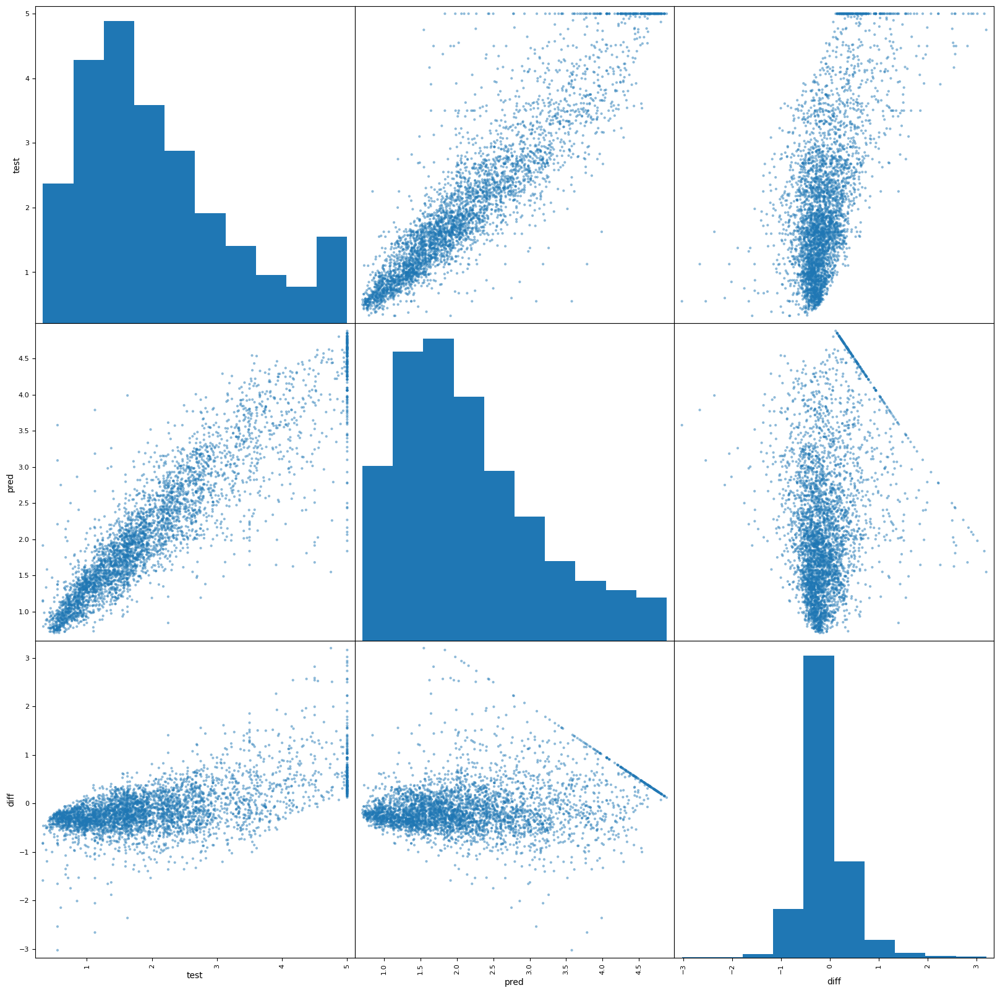

In [77]:
scatter_matrix(df)
plt.rcParams["figure.figsize"] = (20,20)
plt.show()